In [1]:
using Pkg
Pkg.status()
Pkg.instantiate()

Project ColonyImages v1.0.0-DEV
Status `C:\Users\ank10ki\Dropbox\phd\Image analysis\ColonyImages\Project.toml`
  [336ed68f] CSV v0.10.11
  [a93c6f00] DataFrames v1.6.1
⌃ [e30172f5] Documenter v1.1.2
  [7a1cc6ca] FFTW v1.7.1
  [5789e2e9] FileIO v1.16.1
  [916415d5] Images v0.26.0
  [2913bbd2] StatsBase v0.34.2
  [ade2ca70] Dates
  [9a3f8284] Random
  [10745b16] Statistics v1.9.0
Info Packages marked with ⌃ have new versions available and may be upgradable.


In [2]:
using Revise, CairoMakie
using ColonyImages
using DataFrames, CSV, FileIO, Dates
import ColorSchemes as co 


[ Info: Precompiling ColonyImages [5b7a77ca-73d2-46a8-bc51-f10182fcfdd6]


In [3]:
df = DataFrame(data_set =String[], colony = String[], time = Int[], 
    metric_OG =Vector{Vector{Int64}}(undef,0), metric_cov = Vector{Vector{Int64}}(undef,0),
    pair_OG =Vector{Vector{Int64}}(undef,0),pair_cov =Vector{Vector{Int64}}(undef,0),OG_size = Int[])

Row,data_set,colony,time,metric_OG,metric_cov,pair_OG,pair_cov,OG_size
,String,String,Int64,Array…,Array…,Array…,Array…,Int64


# 1.Create Eden Model schematic

### 1.1 Set Parameters

In [4]:
df2 = DataFrame(time = Float64[0,48,96,144])
time_points = df2.time;
# automatically inverts images if neccesarry 

# threshold_conv has to be lowered for not homogenoulsy filled colonies
threshold_conv = 0.8
threshold_c = 0.8
# kernel ratio is given against approximate site of colony calculated by occupied points
kernel_ratio = 0.4
steps_angular = 360
# the more the better, only limited by computation time
samples_pair = 2000000

im_size = [600,600]
stacks = length(time_points)

### set radius of starting colony to fixed ratio, does not matter as
### following values or analyses are relative anyway
radius_circle = round(Int,(im_size[1]*0.05))
Center = round.(Int,im_size./2)
## growth_rate has been calculated by fitting a exponential curve to the data
growth_rate  = 0.02971700864000873
# calculates relative colony size in regards to normalized starting size = 1
colony_size(t) =(1+growth_rate).^t 
Points = lattice_points(Int(maximum(im_size)÷2));
col_size_add = (colony_size.(time_points).-1)
col_size_add_diff = col_size_add[2:end]-col_size_add[1:end-1];

### 1.2 Create spherical  starting colony 

In [5]:
colony  =zeros(Bool, im_size...,stacks);
colony = BitArray(colony)

build_artifical_colony!(Center,(@view colony[:,:,1]),radius_circle,Points)
pixel_to_add = round.(Int,sum(colony[:,:,1]).*(col_size_add_diff))

3-element Vector{Int64}:
   9225
  37621
 153422

### 1.3 Randomly expand spherical starting colony 

In [6]:
for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round.(Int,sum(int_img).*(col_size_add_diff))
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
        end
end   

### 1.4 Make Plot

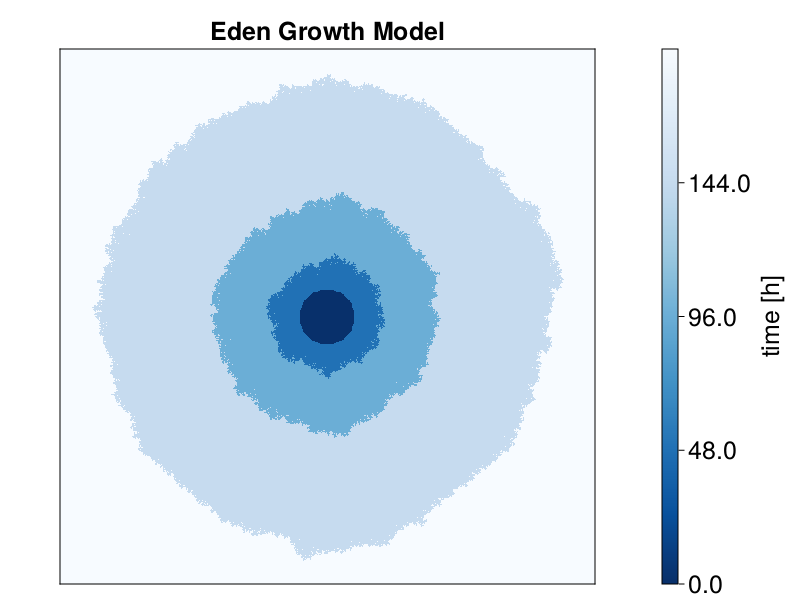

In [7]:
blue_rev = reverse(co.Blues)
fontsize_theme = Theme(fontsize = 25)
update_theme!(fontsize_theme)

fig_eden = Figure(size= (1600, 1600))
ax = Axis(fig_eden[1,1],aspect = DataAspect(),title = "Eden Growth Model")
int_img = zeros(Int,im_size...)
for z in 1:size(colony,3)
    int_img += colony[:,:,z]
    #heatmap!(ax,int_img, colormap = (:blues,0.3), label = "t = $(time_points[z])h")
end 
heaty = heatmap!(ax,(int_img .-(maximum(int_img))) .*-1 , colormap = blue_rev)
#heaty = heatmap!(ax,(int_img) , colormap = (:blues))
hidedecorations!(ax)
Colorbar(fig_eden[1,2], heaty ,ticks = (0:3,string.(time_points)), label = "time [h]")
#axislegend(ax)

save("plots/eden_growth_model.pdf",fig_eden)
fig_eden

# 2. Make convolution Schematic

### 2.1 Create empty colony

In [123]:
x = 10
y = 10
im_size = [x,y]
time_points = Float64[0,24,48,72,96,120]

stacks = length(time_points)

colony  =zeros(Bool, im_size...,stacks);
colony = BitArray(colony)

colony_cov =zeros(Float64, im_size...,stacks);

radius_circle = round(Int,(im_size[1]*0.05))
Center = round.(Int,im_size./2)
## growth_rate has been calculated by fitting a exponential curve to the data
growth_rate  = 0.02971700864000873
# calculates relative colony size in regards to normalized starting size = 1
colony_size(t) =(1+growth_rate).^t 
Points = lattice_points(Int(maximum(im_size)÷2));
col_size_add = (colony_size.(time_points).-1)
col_size_add_diff = col_size_add[2:end]-col_size_add[1:end-1];

build_artifical_colony!(Center,(@view colony[:,:,1]),radius_circle,Points)
pixel_to_add = round.(Int,sum(colony[:,:,1]).*(col_size_add_diff))

5-element Vector{Int64}:
  1
  2
  4
  8
 17

In [124]:
for (j,t) in enumerate(time_points)
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    if j == 1
        build_artifical_colony!(Center,int_img,radius_circle,Points)
        pixel_to_add = round.(Int,sum(int_img).*(col_size_add_diff))
    else
        # for unkown reason views require [:] to make assignments 
        int_img[:] = colony[:,:,j-1]
        colony_cov[:,:,j] = expand_colony_radom_cov_show!(int_img,pixel_to_add[j-1])
    end
end   

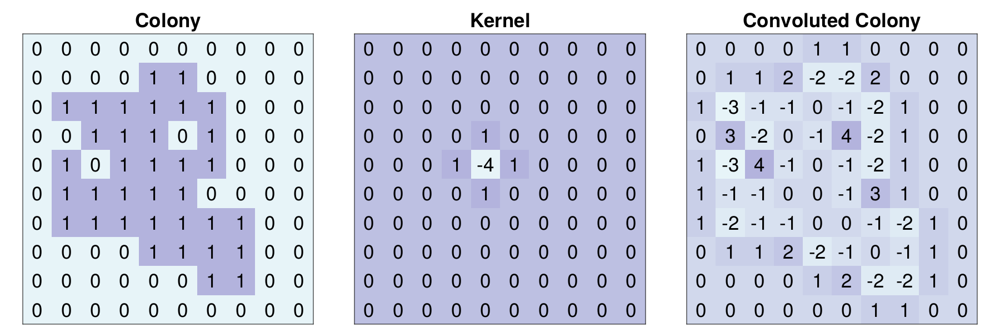

In [160]:
fontsize_theme = Theme(fontsize = 35)
update_theme!(fontsize_theme)

t = length(time_points)
data = colony[:,:,t]
data_cov = colony_cov[:,:,t]
laplac_kernel = [0 1 0; 1 -4 1; 0 1 0]
kernel  = zeros(Int,x,y)
kernel[(1:size(laplac_kernel,1)).+3 , (1:size(laplac_kernel,2)).+4] .= laplac_kernel

cov_fig_k = Figure(resolution = (1800,600))
col_ax_k = Axis(cov_fig_k[1,1],aspect = DataAspect(),title = "Colony")
col_heat_k = heatmap!(col_ax_k,data, colormap = (:blues,0.3))
hidedecorations!(col_ax_k)
cov_ax_k2 = Axis(cov_fig_k[1,2],aspect = DataAspect(),title = "Kernel")
cov_heat_k2 = heatmap!(cov_ax_k2,kernel, colormap = (:blues,0.3))
hidedecorations!(cov_ax_k2)


cov_ax = Axis(cov_fig_k[1,3],aspect = DataAspect(),title = "Convoluted Colony")
cov_heat = heatmap!(cov_ax,data_cov, colormap = (:blues,0.3))
hidedecorations!(cov_ax)


for i in 1:x
    for j in 1:y
        text!(cov_ax_k2,"$(round(Int,kernel[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
        text!(col_ax_k,"$(round(Int,data[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
        text!(cov_ax,"$(round(Int,data_cov[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))

    end
end

save("plots/cov_fig_kernel.png", cov_fig_k)
cov_fig_k

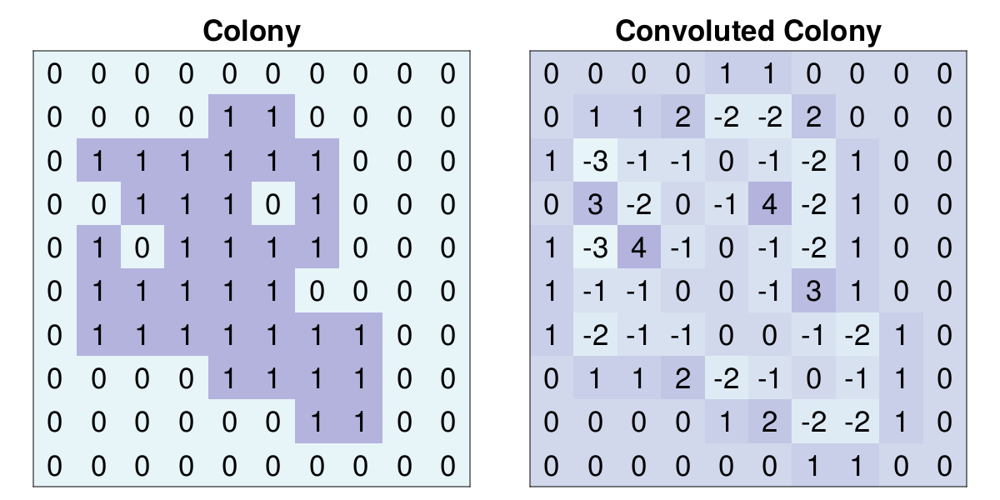

In [161]:
t = length(time_points)
data = colony[:,:,t]
data_cov = colony_cov[:,:,t]

cov_fig = Figure(resolution = (1200,600))
col_ax = Axis(cov_fig[1,1],aspect = DataAspect(),title = "Colony")
col_heat = heatmap!(col_ax,data, colormap = (:blues,0.3))
hidedecorations!(col_ax)
cov_ax = Axis(cov_fig[1,2],aspect = DataAspect(),title = "Convoluted Colony")
cov_heat = heatmap!(cov_ax,data_cov, colormap = (:blues,0.3))
hidedecorations!(cov_ax)


for i in 1:x
    for j in 1:y
        text!(col_ax,"$(round(Int,data[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
        text!(cov_ax,"$(round(Int,data_cov[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
    end
end

save("plots/cov_fig.png", cov_fig)
cov_fig

In [162]:
point = [3,6]
data_cov = expand_colony_point!(data, data_cov, point);

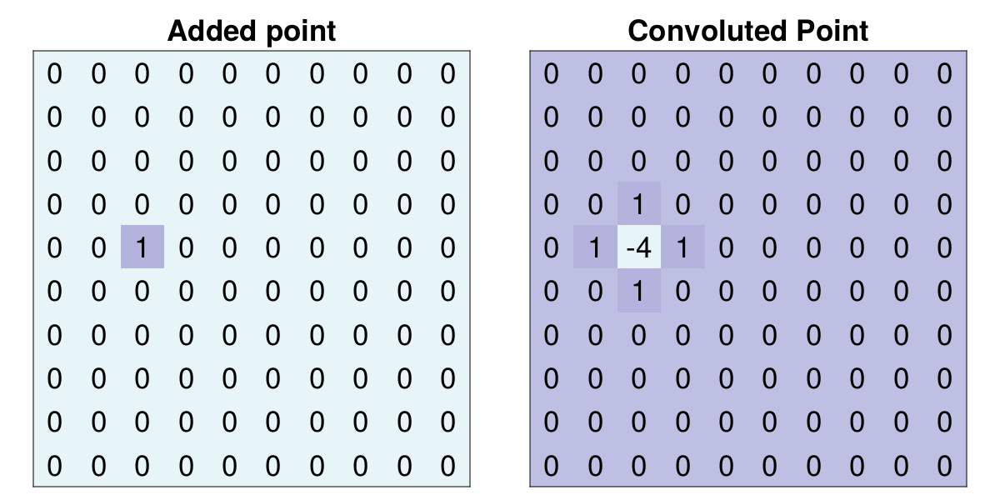

In [163]:
laplac_kernel = [0 1 0; 1 -4 1; 0 1 0]
cov_add = zeros(Int, x,y)
data_add = zeros(Int, x,y)

cov_add[point[1]-1:point[1]+1,point[2]-1:point[2]+1] += laplac_kernel
data_add[point...] += 1

cov_fig2 = Figure(resolution = (1200,600))
col_ax2 = Axis(cov_fig2[1,1],aspect = DataAspect(),title = "Added point")
col_heat2 = heatmap!(col_ax2,data_add, colormap = (:blues,0.3))
hidedecorations!(col_ax2)
cov_ax2 = Axis(cov_fig2[1,2],aspect = DataAspect(),title = "Convoluted Point")
cov_heat2 = heatmap!(cov_ax2,cov_add, colormap = (:blues,0.3))
hidedecorations!(cov_ax2)

for i in 1:x
    for j in 1:y
        text!(col_ax2,"$(round(Int,data_add[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
        text!(cov_ax2,"$(round(Int,cov_add[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
    end
end
save("plots/cov_fig2.png", cov_fig2)

cov_fig2

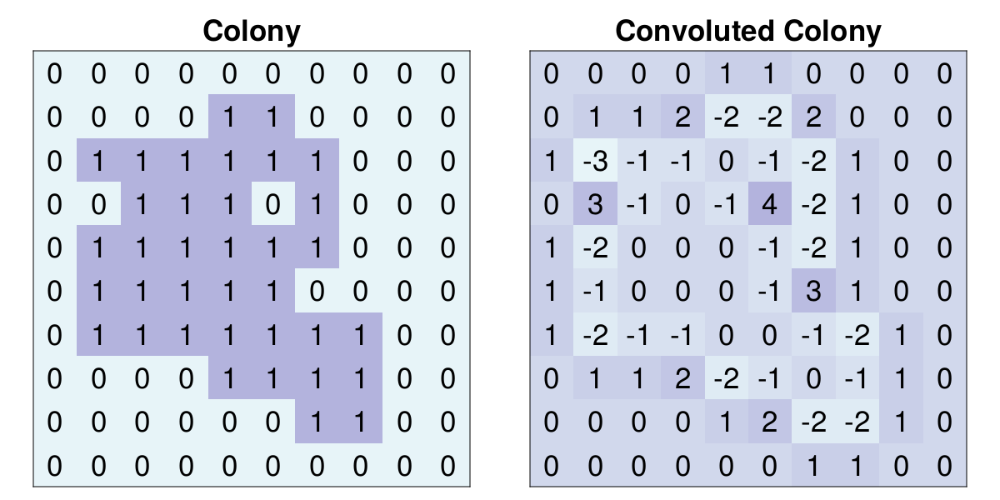

In [164]:
cov_fig3 = Figure(resolution = (1200,600))
col_ax3 = Axis(cov_fig3[1,1],aspect = DataAspect(),title = "Colony")
col_heat3 = heatmap!(col_ax3,data, colormap = (:blues,0.3))
hidedecorations!(col_ax3)
cov_ax3 = Axis(cov_fig3[1,2],aspect = DataAspect(),title = "Convoluted Colony")
cov_heat3 = heatmap!(cov_ax3,data_cov, colormap = (:blues,0.3))
hidedecorations!(cov_ax3)

for i in 1:x
    for j in 1:y
        text!(col_ax3,"$(round(Int,data[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
        text!(cov_ax3,"$(round(Int,data_cov[i,j]))", position = (i, j),
        color = "black", align = (:center, :center))
    end
end
save("plots/cov_fig3.png", cov_fig3)

cov_fig3

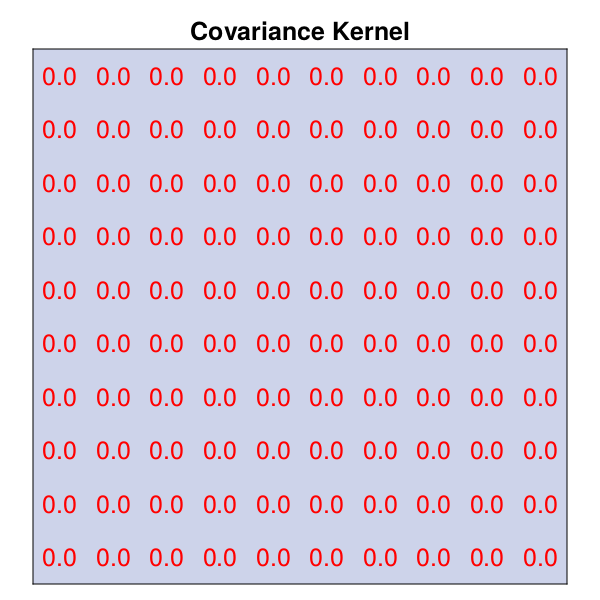

In [59]:
x = 10
y = 10
data = zeros(x,y)

cov_fig = Figure(resolution = (600,600))
cov_ax = Axis(cov_fig[1,1],aspect = DataAspect(),title = "Covariance Kernel")
cov_heat = heatmap!(cov_ax,data, colormap = (:blues,0.3))
hidedecorations!(cov_ax)
for i in 1:x
    for j in 1:y
        text!(cov_ax,"$(round(data[i,j], digits = 1))", position = (i, j),
        color = "red", align = (:center, :center))
    end
end
cov_fig


In [54]:
df2 = DataFrame(time = Float64[0,48,96,144])
time_points = df2.time;
# automatically inverts images if neccesarry 

# threshold_conv has to be lowered for not homogenoulsy filled colonies
threshold_conv = 0.8
threshold_c = 0.8
# kernel ratio is given against approximate site of colony calculated by occupied points
kernel_ratio = 0.4
steps_angular = 360
# the more the better, only limited by computation time
samples_pair = 2000000

im_size = [10,10]
stacks = length(time_points)

### set radius of starting colony to fixed ratio, does not matter as
### following values or analyses are relative anyway
radius_circle = round(Int,(im_size[1]*0.05))
Center = round.(Int,im_size./2)
## growth_rate has been calculated by fitting a exponential curve to the data
growth_rate  = 0.02971700864000873
# calculates relative colony size in regards to normalized starting size = 1
colony_size(t) =(1+growth_rate).^t 
Points = lattice_points(Int(maximum(im_size)÷2));
col_size_add = (colony_size.(time_points).-1)
col_size_add_diff = col_size_add[2:end]-col_size_add[1:end-1];

In [55]:
colony  =zeros(Bool, im_size...,stacks);
colony = BitArray(colony)

build_artifical_colony!(Center,(@view colony[:,:,1]),radius_circle,Points)
pixel_to_add = round.(Int,sum(colony[:,:,1]).*(col_size_add_diff))

3-element Vector{Int64}:
  3
 13
 51

## Create empty datastructure for colony images

In [12]:
colony_nr = 4
colonies = (["Colony $(x) artifical" for x in 1:colony_nr])
img_int_vec_2 = Vector{BitArray{3}}(undef, 0)
for i in 1:colony_nr
    hans =zeros(Bool, im_size...,stacks);
    hans = BitArray(hans)
    push!(img_int_vec_2, hans)
end
build_artifical_colony!(Center,(@view img_int_vec_2[1][:,:,1]),radius_circle,Points)
pixel_to_add = round.(Int,sum(img_int_vec_2[1][:,:,1]).*(col_size_add_diff))

3-element Vector{Int64}:
   9225
  37621
 153422

### Populate system with random growing colonies depending on time

Test if everything works for one colony series

In [13]:
colony = img_int_vec_2[1]  
for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round.(Int,sum(img_int_vec_2[1][:,:,1]).*(col_size_add_diff))
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
        end
end   


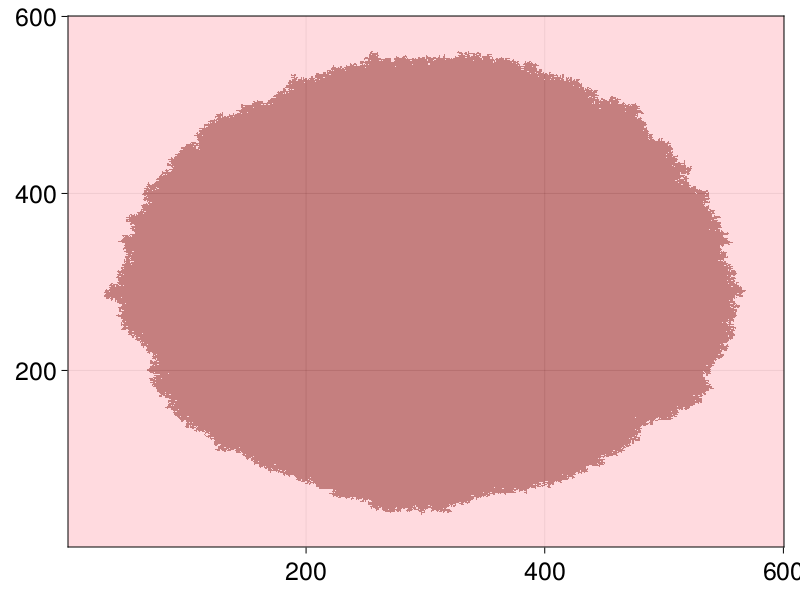

In [15]:
fig1 =heatmap(img_int_vec_2[1][:,:,end], colormap = (:reds,0.5))
#heatmap!(fig1.axis,distance_transform(feature_transform(img_int_vec_2[1][:,:,6])).== 1, colormap = (:blues, 0.5))
fig1

Populate all colonies 

In [18]:
data_set = "random $(Dates.format(now(), "yyyy_mm_dd"))"

for (i,colony) in enumerate(img_int_vec_2)
    for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round.(Int,sum(img_int_vec_2[1][:,:,1]).*(col_size_add_diff))
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
        end
    end   
end

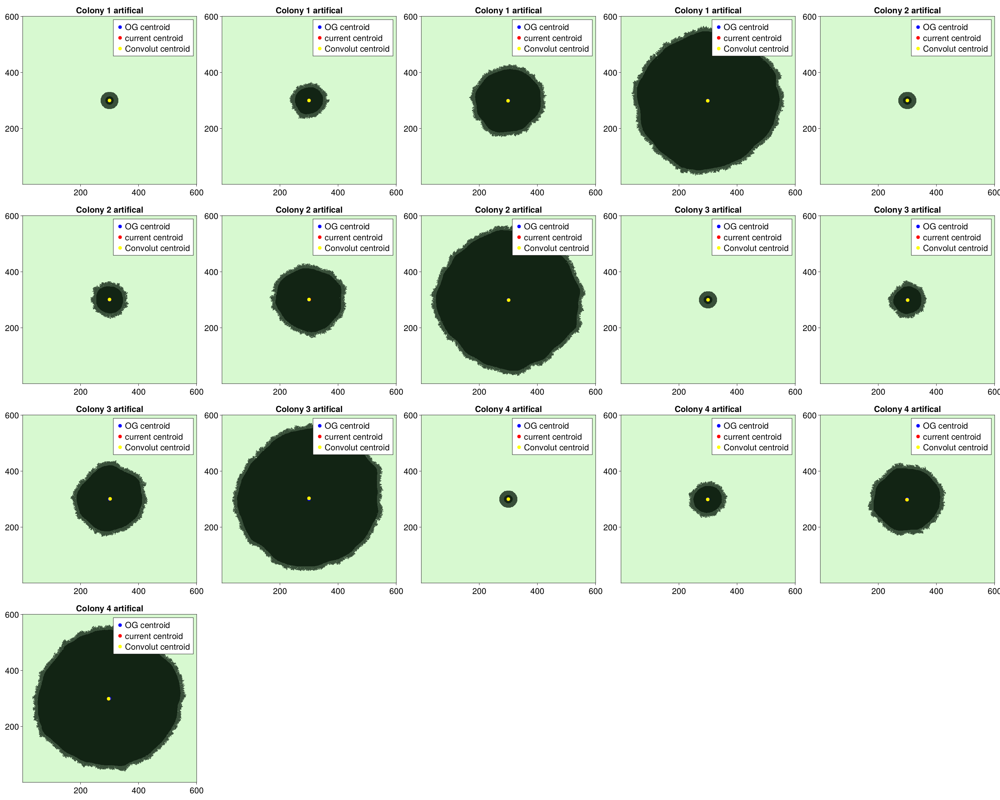

In [19]:
fig_big = Figure(resolution = res_scaling(img_int_vec_2, factor =3))

c = 0 
for (i,img_stack) in enumerate(img_int_vec_2)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> threshold_conv)
        y,x = centroid(int_img)
        ax = CairoMakie.Axis(fig_big[c÷5+1,c%5+1], title = colonies[i])
        #hidedecorations!(ax)
        heatmap!(ax,int_img,colormap = :algae)
        heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "OG centroid")
        
        scatter!(ax,y,x, color = :red, markersize = 15, label = "current centroid")
        scatter!(ax,y_c, x_c, color = :yellow, markersize = 15, label = "Convolut centroid")
        axislegend(ax)
        c += 1
            
    end

end
fig_big

 30.835261 seconds (338.47 M allocations: 24.358 GiB, 12.31% gc time, 5.48% compilation time)

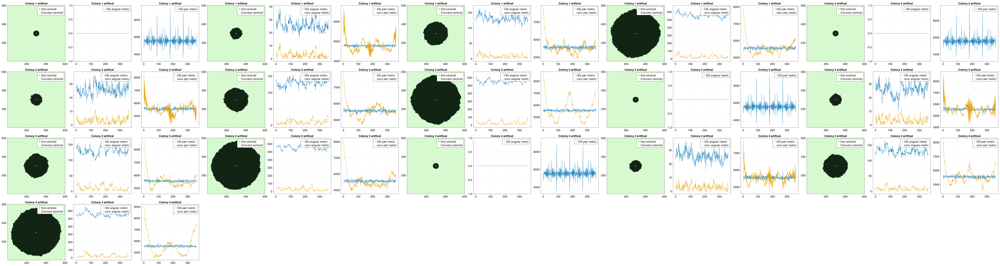

In [20]:
@time begin
a = 1
fig_big = Figure(resolution = res_scaling(img_int_vec_2, factor =3, plots = 3))
c = 0 

for (i,img_stack) in enumerate(img_int_vec_2)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> threshold_conv)
        ang_mec_og = angular_metric(int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular)
        pair_mec_og = pair_cor_metric3(z == 1 ? int_img : int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular,samples = samples_pair)
        
        fitted_circle = build_circle([y_c, x_c], int_img, Points, threshold = threshold_c)
        ang_mec_conv = angular_metric(z == 1 ? int_img : int_img .- fitted_circle , [y1,x1], steps = steps_angular )
        
        pair_mec_conv = pair_cor_metric3(z == 1 ? int_img : int_img.- fitted_circle, [y_c, x_c], steps = steps_angular,samples = samples_pair )
        
        ax = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-2], title = colonies[i])
        heatmap!(ax,int_img,colormap = :algae)
        #heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        scatter!(ax,y1,x1, color = :blue, markersize = 10, label = "first centroid")
        scatter!(ax,y_c, x_c, color = :yellow, markersize = 10, label = "Convolut centroid")
        axislegend(ax)
        
        ax2 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-1], title = colonies[i])
        lines!(ax2,ang_mec_og, label = "OG angular metric" )
        
        ax3 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3], title = colonies[i])
        lines!(ax3,pair_mec_og, label = "OG pair metric" )
        # convoluted angular metrix does not make sense for colony without expansion 
        if z != 1
            lines!(ax2,ang_mec_conv, label = "conv angular metric" )
            lines!(ax3,pair_mec_conv, label = "conv pair metric" )
        end
        axislegend(ax2)
        axislegend(ax3)
        push!(df,[data_set,colonies[i],time_points[z],ang_mec_og,ang_mec_conv,pair_mec_og,pair_mec_conv,sum(img_stack[:,:,1])])
        c += 1
             
    end

end


fig_big
end

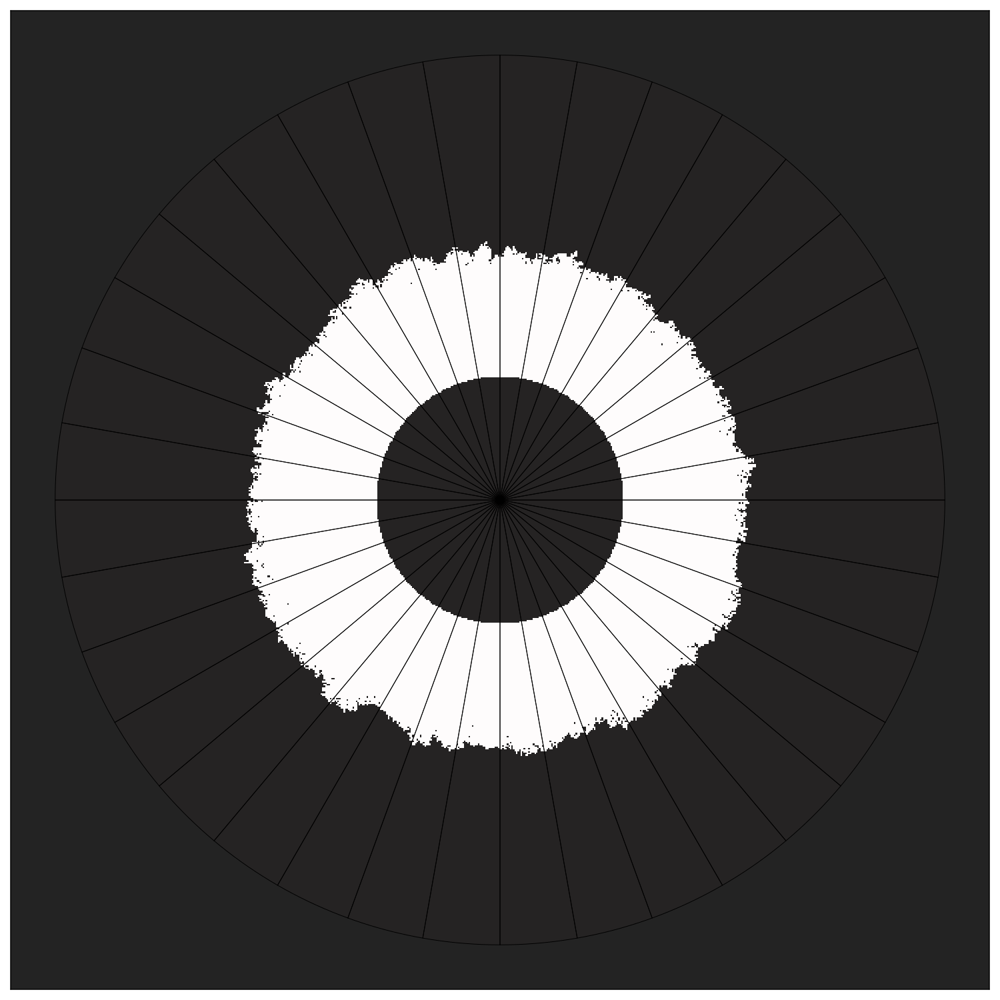

In [ ]:
fig_89 = Figure(resolution =(1500,round(Int,1500)), fontsize = 28)
int_img = img_int_vec_2[2][:,:,1]
y1,x1 = centroid(int_img)
kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
nneigh = sum(kernel)

int_img = img_int_vec_2[2][:,:,6]
#int_img = hcat(int_img[1:end-18,70:end],zeros(Int,1812-18,24))
#int_img = expand_matrix(int_img, annuli= 70)

cut_fac =480


int_img = int_img[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]
int_img = rotr90(int_img)



out = conv( int_img, kernel ) ./ nneigh
y_c, x_c = centroid(out .> threshold_conv)
y,x = centroid(int_img)
ax = CairoMakie.Axis(fig_89[1,1])
ax2 = CairoMakie.Axis(fig_89[1,1])
hidedecorations!(ax2)
hidedecorations!(ax)

#circle_kernel = build_circle([y_c, x_c],int_img,Points,threshold = 0.8)
#heatmap!(ax,int_img,colormap = (:hawaii,1.0))
#heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
#heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))

int_img_1 = img_int_vec_2[2][:,:,1]
int_img_1 = int_img_1[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]


int_img_1 = rotr90(int_img_1)
#heatmap!(ax,int_img,colormap = (:grayC10,1.0))

heatmap!(ax,int_img.-int_img_1,colormap = (:grayC10,1.0))
#heatmap!(ax,int_img_1, colormap  =(:thermal, 0.5))
#scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")

#scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
#scatter!(ax,y_c, x_c, color = :black, markersize = 45, label = "Centroid")
pie_data = [1 for i in 1:10:360]
pie!(ax2,pie_data,radius = 10, color = (:red, 0.01))
#axislegend(ax)
fig_89

### Save data and create foloder with data names

In [27]:
path = joinpath(image_data,data_set)

"artificial data\\random 2023_11_08"

In [28]:
mkpath(path)
save(joinpath(path,"angular_pair_random_metrics.png"), fig_89)

CairoMakie.Screen{IMAGE}


In [29]:
df

Row,data_set,colony,time,metric_OG,metric_cov,pair_OG,pair_cov,OG_size
,String,String,Int64,Array…,Array…,Array…,Array…,Int64
1,circular 2023_11_08,Colony 1 artifical,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0 … 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[63, 46, 59, 53, 58, 57, 57, 58, 56, 62 … 53, 62, 56, 58, 57, 57, 58, 53, 59, 63]","[5483, 5610, 5504, 5756, 5714, 5574, 5521, 5587, 5652, 5442 … 5566, 5595, 5585, 5617, 5490, 5546, 5597, 5555, 5565, 5560]","[5556, 5626, 5467, 5687, 5670, 5446, 5542, 5623, 5696, 5632 … 5460, 5534, 5563, 5481, 5453, 5568, 5558, 5508, 5614, 5628]",20589
2,circular 2023_11_08,Colony 1 artifical,6,"[12, 16, 8, 15, 9, 13, 10, 11, 11, 11 … 11, 11, 11, 11, 10, 13, 9, 15, 8, 12]","[0, 0, 0, 0, 0, 0, 2, 1, 2, 0 … 1, 0, 2, 1, 2, 0, 0, 0, 0, 0]","[4760, 5882, 5575, 5205, 5528, 5878, 5618, 5411, 5425, 5769 … 5673, 5446, 5455, 5663, 5789, 5551, 5249, 5636, 5889, 5359]","[0, 7950, 6284, 3162, 5956, 7792, 6168, 4220, 5095, 6750 … 6834, 5104, 4288, 6188, 7900, 6044, 3157, 6343, 7970, 6944]",20589
3,circular 2023_11_08,Colony 1 artifical,20,"[42, 56, 45, 48, 46, 46, 45, 44, 46, 46 … 45, 46, 46, 44, 45, 46, 46, 48, 45, 42]","[0, 0, 0, 0, 0, 0, 2, 2, 0, 0 … 2, 0, 0, 2, 2, 0, 0, 0, 0, 0]","[5372, 5470, 5670, 5695, 5642, 5405, 5525, 5529, 5565, 5493 … 5602, 5684, 5479, 5544, 5518, 5536, 5714, 5597, 5555, 5484]","[324, 6046, 6727, 5490, 5261, 6084, 6753, 5606, 5800, 7294 … 7177, 5851, 5695, 6720, 5853, 5148, 5548, 6532, 5947, 6999]",20589
4,circular 2023_11_08,Colony 1 artifical,24,"[54, 70, 57, 60, 58, 58, 59, 59, 58, 58 … 59, 58, 58, 59, 59, 58, 58, 60, 57, 54]","[0, 0, 2, 2, 2, 2, 2, 2, 2, 2 … 2, 2, 2, 2, 2, 2, 2, 2, 2, 0]","[5413, 5601, 5470, 5459, 5479, 5584, 5575, 5697, 5479, 5653 … 5560, 5572, 5564, 5545, 5615, 5534, 5520, 5612, 5563, 5579]","[3976, 4474, 5688, 5234, 6200, 5181, 5202, 6241, 5242, 6068 … 6044, 5195, 6215, 5271, 5118, 6186, 5206, 5577, 4499, 6942]",20589
5,circular 2023_11_08,Colony 1 artifical,44,"[152, 150, 152, 152, 148, 150, 152, 150, 150, 151 … 149, 151, 150, 150, 152, 150, 148, 152, 152, 152]","[0, 0, 0, 2, 3, 2, 3, 1, 2, 2 … 3, 2, 2, 1, 3, 2, 3, 2, 0, 0]","[5535, 5618, 5550, 5348, 5615, 5512, 5665, 5576, 5596, 5536 … 5618, 5468, 5591, 5563, 5596, 5583, 5614, 5398, 5618, 5561]","[3496, 5420, 5735, 7039, 5301, 5714, 5274, 5348, 5537, 6133 … 6099, 5483, 5364, 5452, 5661, 5290, 7127, 5725, 5380, 5984]",20589
6,circular 2023_11_08,Colony 1 artifical,48,"[179, 177, 173, 178, 178, 175, 177, 176, 175, 175 … 177, 175, 175, 176, 177, 175, 178, 178, 173, 179]","[0, 0, 0, 0, 0, 3, 3, 0, 3, 1 … 1, 1, 3, 0, 3, 3, 0, 0, 0, 0]","[5537, 5456, 5572, 5537, 5391, 5644, 5641, 5573, 5614, 5583 … 5518, 5569, 5648, 5621, 5580, 5508, 5579, 5680, 5493, 5604]","[4547, 4384, 6569, 5183, 6078, 6373, 5666, 6235, 5087, 5039 … 4910, 5297, 6359, 5610, 6387, 6279, 5282, 6568, 4490, 8718]",20589
7,circular 2023_11_08,Colony 2 artifical,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0 … 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[63, 46, 59, 53, 58, 57, 57, 58, 56, 62 … 53, 62, 56, 58, 57, 57, 58, 53, 59, 63]","[5578, 5600, 5541, 5634, 5609, 5510, 5557, 5509, 5423, 5522 … 5587, 5685, 5691, 5472, 5323, 5663, 5518, 5644, 5527, 5646]","[5488, 5675, 5632, 5590, 5577, 5592, 5592, 5510, 5529, 5489 … 5646, 5585, 5546, 5451, 5488, 5515, 5627, 5487, 5649, 5503]",20589
8,circular 2023_11_08,Colony 2 artifical,6,"[12, 16, 8, 15, 9, 13, 10, 11, 11, 11 … 11, 11, 11, 11, 10, 13, 9, 15, 8, 12]","[0, 0, 0, 0, 0, 0, 2, 1, 2, 0 … 1, 0, 2, 1, 2, 0, 0, 0, 0, 0]","[4873, 5918, 5761, 5316, 5458, 5784, 5580, 5413, 5396, 5720 … 5768, 5349, 5422, 5700, 5721, 5448, 5235, 5592, 5924, 5429]","[0, 8073, 6340, 3216, 5840, 7915, 6131, 4309, 5071, 6783 … 6809, 4982, 4288, 6149, 7689, 6031, 3075, 6382, 7805, 6834]",20589
9,circular 2023_11_08,Colony 2 artifical,20,"[42, 56, 45, 48, 46, 46, 45, 44, 46, 46 … 45, 46, 46, 44, 45, 46, 46, 48, 45, 42]","[0, 0, 0, 0, 0, 0, 2, 2, 0, 0 … 2, 0, 0, 2, 2, 0, 0, 0, 0, 0]","[5313, 5587, 5579, 5628, 5542, 5613, 5659, 5576, 5567, 5624 … 5501, 5614, 5588, 5617, 5563, 

## Create empty datastructure for colony images

In [30]:
colony_nr = 4
colonies = (["Colony $(x) artifical" for x in 1:colony_nr])
img_int_vec_3 = Vector{BitArray{3}}(undef, 0)
for i in 1:colony_nr
    hans =zeros(Bool, im_size...,stacks);
    hans = BitArray(hans)
    push!(img_int_vec_3, hans)
end
build_artifical_colony!(Center,(@view img_int_vec_3[1][:,:,1]),radius_circle,Points)
pixel_to_add = round(Int,sum(img_int_vec_3[1][:,:,1])).*(col_size_add_diff)

5-element Vector{Float64}:
  3954.8434342621044
 12438.37685962348
  4595.868920983507
 33104.99664375041
  9281.045607678687

### Populate system with random fractaly growing colonies depending on time

Test if everything works for one colony series

In [31]:
colony = img_int_vec_3[1]  
for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round(Int,sum(img_int_vec_3[1][:,:,1])).*(col_size_add_diff)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_fractal_radom_cov!(int_img,pixel_to_add[j-1])
        end
end   


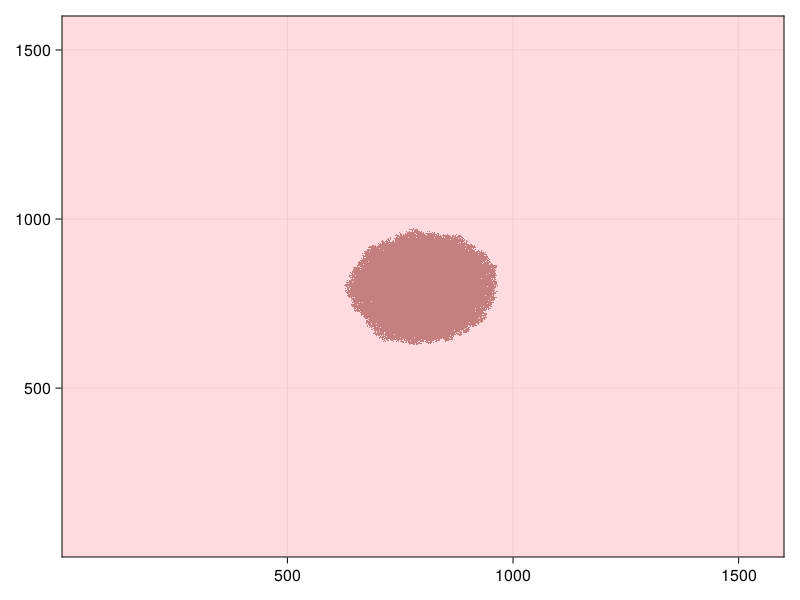

In [32]:
fig1 =heatmap(img_int_vec_3[1][:,:,6], colormap = (:reds,0.5))
#heatmap!(fig1.axis,distance_transform(feature_transform(img_int_vec_2[1][:,:,6])).== 1, colormap = (:blues, 0.5))
fig1

In [33]:
data_set = "random_fractal $(Dates.format(now(), "yyyy_mm_dd"))"

for (i,colony) in enumerate(img_int_vec_3)
    for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round(Int,sum(img_int_vec_3[1][:,:,1])).*(col_size_add_diff)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
        end
    end   
end

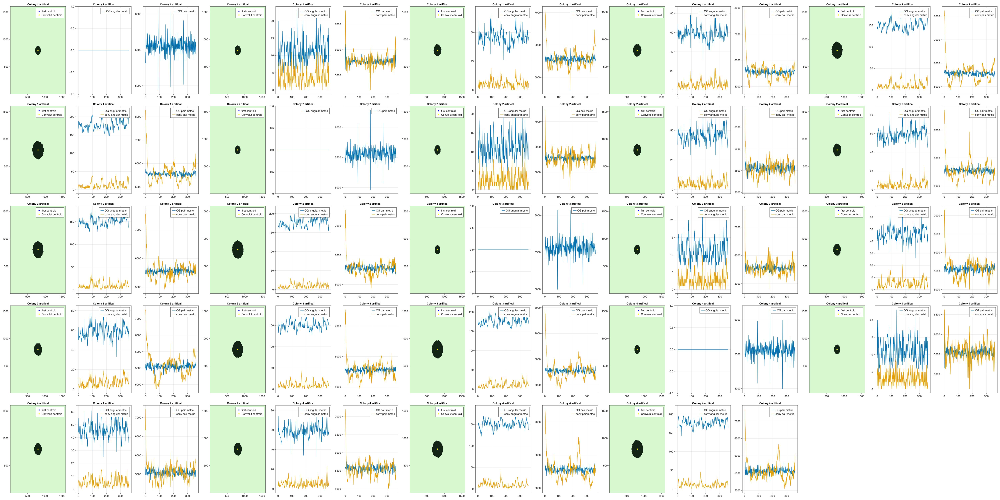

In [34]:
a = 1
fig_big = Figure(resolution = res_scaling(img_int_vec_3, factor =3, plots = 2))
c = 0 

for (i,img_stack) in enumerate(img_int_vec_3)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> threshold_conv)
        ang_mec_og = angular_metric(int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular)
        pair_mec_og = pair_cor_metric3(z == 1 ? int_img : int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular,samples = samples_pair)
        
        fitted_circle = build_circle([y_c, x_c], int_img, Points, threshold = threshold_c)
        ang_mec_conv = angular_metric(z == 1 ? int_img : int_img .- fitted_circle , [y1,x1], steps = steps_angular )
        
        pair_mec_conv = pair_cor_metric3(z == 1 ? int_img : int_img.- fitted_circle, [y_c, x_c], steps = steps_angular,samples = samples_pair )
        
        ax = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-2], title = colonies[i])
        heatmap!(ax,int_img,colormap = :algae)
        #heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        scatter!(ax,y1,x1, color = :blue, markersize = 10, label = "first centroid")
        scatter!(ax,y_c, x_c, color = :yellow, markersize = 10, label = "Convolut centroid")
        axislegend(ax)
        
        ax2 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-1], title = colonies[i])
        lines!(ax2,ang_mec_og, label = "OG angular metric" )
        
        ax3 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3], title = colonies[i])
        lines!(ax3,pair_mec_og, label = "OG pair metric" )
        # convoluted angular metrix does not make sense for colony without expansion 
        if z != 1
            lines!(ax2,ang_mec_conv, label = "conv angular metric" )
            lines!(ax3,pair_mec_conv, label = "conv pair metric" )
        end
        axislegend(ax2)
        axislegend(ax3)
        push!(df,[data_set,colonies[i],time_points[z],ang_mec_og,ang_mec_conv,pair_mec_og,pair_mec_conv,sum(img_stack[:,:,1])])
        c += 1
             
    end

end


fig_big


In [35]:
path = joinpath(image_data,data_set)

"artificial data\\random_fractal 2023_11_08"

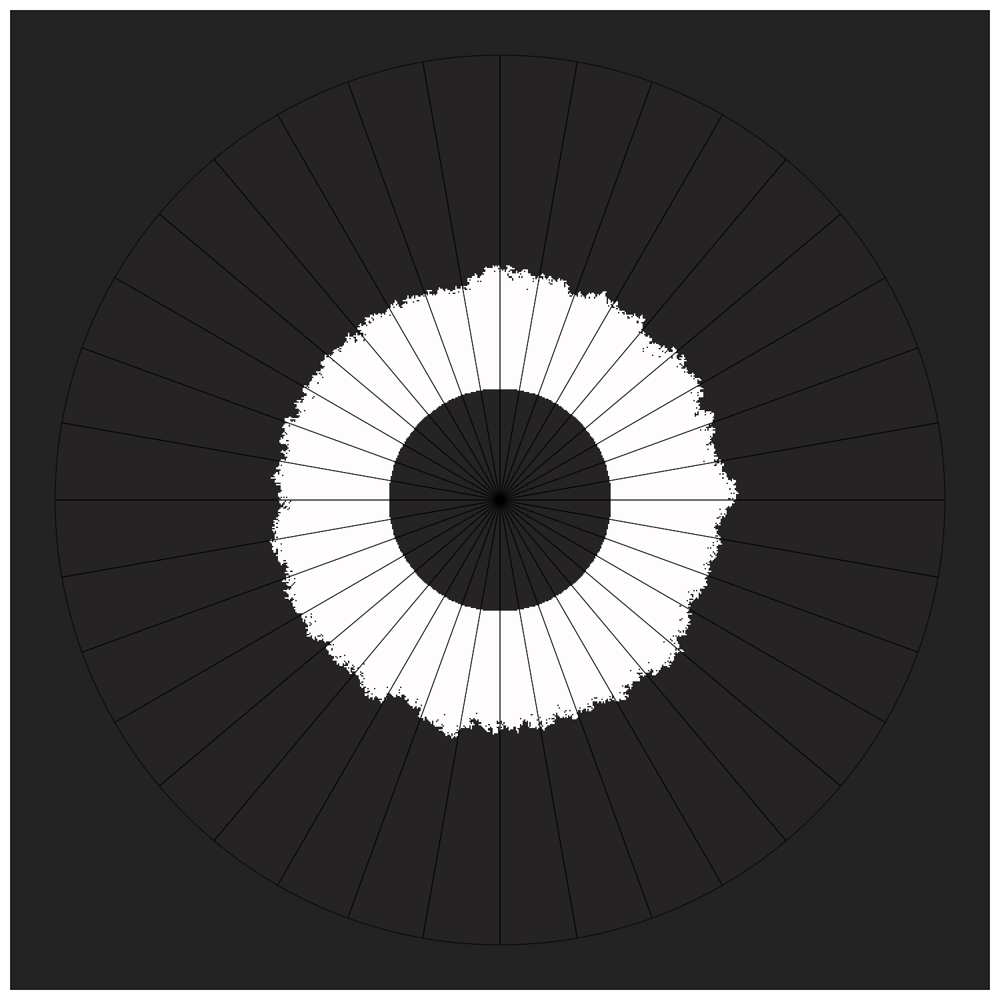

In [36]:
fig_89 = Figure(resolution =(1500,round(Int,1500)), fontsize = 28)
int_img = img_int_vec_3[2][:,:,1]
y1,x1 = centroid(int_img)
kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
nneigh = sum(kernel)

int_img = img_int_vec_3[2][:,:,end]
#int_img = hcat(int_img[1:end-18,70:end],zeros(Int,1812-18,24))
#int_img = expand_matrix(int_img, annuli= 70)

cut_fac =445


int_img = int_img[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]
int_img = rotr90(int_img)



out = conv( int_img, kernel ) ./ nneigh
y_c, x_c = centroid(out .> threshold_conv)
y,x = centroid(int_img)
ax = CairoMakie.Axis(fig_89[1,1])
ax2 = CairoMakie.Axis(fig_89[1,1])
hidedecorations!(ax2)
hidedecorations!(ax)

#circle_kernel = build_circle([y_c, x_c],int_img,Points,threshold = 0.8)
#heatmap!(ax,int_img,colormap = (:hawaii,1.0))
#heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
#heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))

int_img_1 = img_int_vec_3[2][:,:,1]
int_img_1 = int_img_1[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]


int_img_1 = rotr90(int_img_1)
#heatmap!(ax,int_img,colormap = (:grayC10,1.0))

heatmap!(ax,int_img.-int_img_1,colormap = (:grayC10,1.0))
#heatmap!(ax,int_img_1, colormap  =(:thermal, 0.5))
#scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")

#scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
#scatter!(ax,y_c, x_c, color = :black, markersize = 45, label = "Centroid")
pie_data = [1 for i in 1:10:360]
pie!(ax2,pie_data,radius = 10, color = (:red, 0.01))
#axislegend(ax)
fig_89

In [37]:
mkpath(path)
save(joinpath(path,"angular_pair_fractal_metrics.png"), fig_89)

CairoMakie.Screen{IMAGE}


## Create empty datastructure for colony images

In [38]:
dir = generate_dir_vec(15, 0.6);

In [39]:
colony_nr = 4
colonies = (["Colony $(x) artifical" for x in 1:colony_nr])
img_int_vec_4 = Vector{BitArray{3}}(undef, 0)
for i in 1:colony_nr
    hans =zeros(Bool, im_size...,stacks);
    hans = BitArray(hans)
    push!(img_int_vec_4, hans)
end
build_artifical_colony!(Center,(@view img_int_vec_4[1][:,:,1]),radius_circle,Points)
pixel_to_add = round(Int,sum(img_int_vec_4[1][:,:,1])).*(col_size_add_diff)

5-element Vector{Float64}:
  3954.8434342621044
 12438.37685962348
  4595.868920983507
 33104.99664375041
  9281.045607678687

### Populate system with randomly fingerlike growing colonies depending on time

Test if everything works for one colony series

In [40]:
colony = img_int_vec_4[1]  
for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round(Int,sum(img_int_vec_4[1][:,:,1])).*(col_size_add_diff)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], dir )
        end
end   


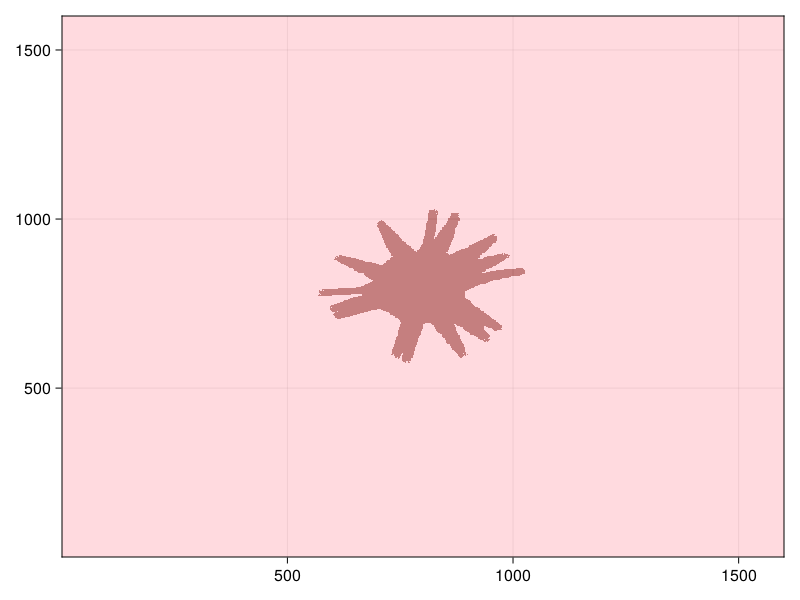

In [41]:
fig1 =heatmap(img_int_vec_4[1][:,:,6], colormap = (:reds,0.5))
#heatmap!(fig1.axis,distance_transform(feature_transform(img_int_vec_2[1][:,:,6])).== 1, colormap = (:blues, 0.5))
fig1

In [42]:
data_set = "random_finger_weak $(Dates.format(now(), "yyyy_mm_dd"))"

for (i,colony) in enumerate(img_int_vec_4)
    dir = generate_dir_vec(15, 0.2);
    for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round(Int,sum(img_int_vec_4[1][:,:,1])).*(col_size_add_diff)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], dir )
        end
    end   
end

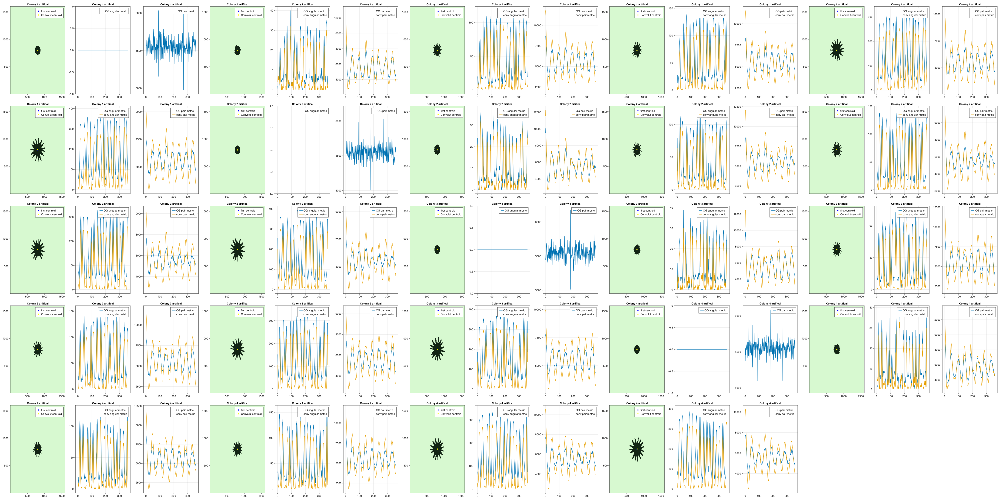

In [43]:
a = 1
fig_big = Figure(resolution = res_scaling(img_int_vec_4, factor =3, plots = 2))
c = 0 

for (i,img_stack) in enumerate(img_int_vec_4)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> threshold_conv)
        ang_mec_og = angular_metric(int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular)
        pair_mec_og = pair_cor_metric3(z == 1 ? int_img : int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular,samples = samples_pair)
        
        fitted_circle = build_circle([y_c, x_c], int_img, Points, threshold = threshold_c)
        ang_mec_conv = angular_metric(z == 1 ? int_img : int_img .- fitted_circle , [y1,x1], steps = steps_angular )
        
        pair_mec_conv = pair_cor_metric3(z == 1 ? int_img : int_img.- fitted_circle, [y_c, x_c], steps = steps_angular,samples = samples_pair )
        
        ax = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-2], title = colonies[i])
        heatmap!(ax,int_img,colormap = :algae)
        #heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        scatter!(ax,y1,x1, color = :blue, markersize = 10, label = "first centroid")
        scatter!(ax,y_c, x_c, color = :yellow, markersize = 10, label = "Convolut centroid")
        axislegend(ax)
        
        ax2 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-1], title = colonies[i])
        lines!(ax2,ang_mec_og, label = "OG angular metric" )
        
        ax3 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3], title = colonies[i])
        lines!(ax3,pair_mec_og, label = "OG pair metric" )
        # convoluted angular metrix does not make sense for colony without expansion 
        if z != 1
            lines!(ax2,ang_mec_conv, label = "conv angular metric" )
            lines!(ax3,pair_mec_conv, label = "conv pair metric" )
        end
        axislegend(ax2)
        axislegend(ax3)
        push!(df,[data_set,colonies[i],time_points[z],ang_mec_og,ang_mec_conv,pair_mec_og,pair_mec_conv,sum(img_stack[:,:,1])])
        c += 1
             
    end

end


fig_big


In [44]:
path = joinpath(image_data,data_set)

"artificial data\\random_finger_weak 2023_11_08"

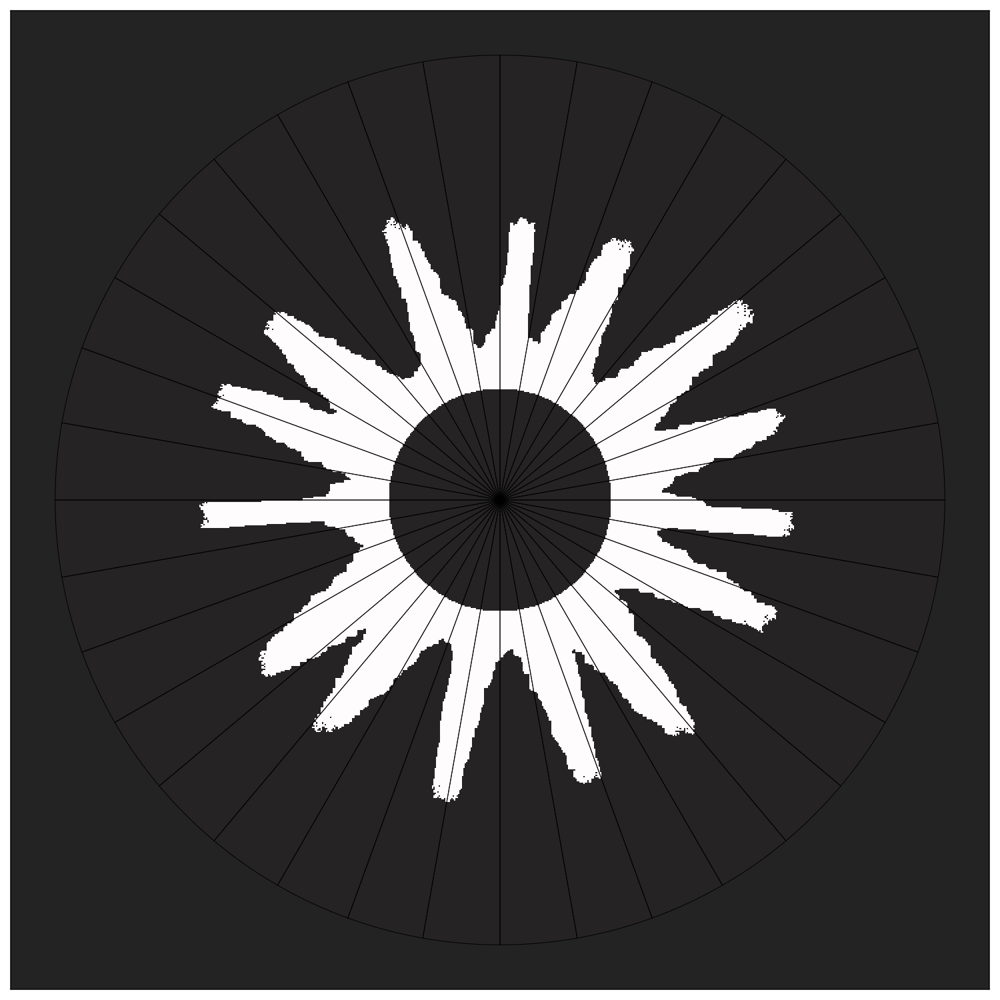

In [45]:
fig_89 = Figure(resolution =(1500,round(Int,1500)), fontsize = 28)
int_img = img_int_vec_4[2][:,:,1]
y1,x1 = centroid(int_img)
kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
nneigh = sum(kernel)

int_img = img_int_vec_4[2][:,:,end]
#int_img = hcat(int_img[1:end-18,70:end],zeros(Int,1812-18,24))
#int_img = expand_matrix(int_img, annuli= 70)

cut_fac =445

int_img = int_img[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]
int_img = rotr90(int_img)



out = conv( int_img, kernel ) ./ nneigh
y_c, x_c = centroid(out .> threshold_conv)
y,x = centroid(int_img)
ax = CairoMakie.Axis(fig_89[1,1])
ax2 = CairoMakie.Axis(fig_89[1,1])
hidedecorations!(ax2)
hidedecorations!(ax)

#circle_kernel = build_circle([y_c, x_c],int_img,Points,threshold = 0.8)
#heatmap!(ax,int_img,colormap = (:hawaii,1.0))
#heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
#heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))

int_img_1 = img_int_vec_4[2][:,:,1]
int_img_1 = int_img_1[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]


int_img_1 = rotr90(int_img_1)
#heatmap!(ax,int_img,colormap = (:grayC10,1.0))

heatmap!(ax,int_img.-int_img_1,colormap = (:grayC10,1.0))
#heatmap!(ax,int_img_1, colormap  =(:thermal, 0.5))
#scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")

#scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
#scatter!(ax,y_c, x_c, color = :black, markersize = 45, label = "Centroid")
pie_data = [1 for i in 1:10:360]
pie!(ax2,pie_data,radius = 10, color = (:red, 0.01))
#axislegend(ax)
fig_89

In [46]:
mkpath(path)
save(joinpath(path,"angular_pair_finger_weak_metrics.png"), fig_89)

CairoMakie.Screen{IMAGE}


## Create empty datastructure for colony images

In [47]:
dir = generate_dir_vec(15, 0.1);

In [48]:
colony_nr = 4
colonies = (["Colony $(x) artifical" for x in 1:colony_nr])
img_int_vec_5 = Vector{BitArray{3}}(undef, 0)
for i in 1:colony_nr
    hans =zeros(Bool, im_size...,stacks);
    hans = BitArray(hans)
    push!(img_int_vec_5, hans)
end
build_artifical_colony!(Center,(@view img_int_vec_5[1][:,:,1]),radius_circle,Points)
pixel_to_add = round(Int,sum(img_int_vec_5[1][:,:,1])).*(col_size_add_diff)

5-element Vector{Float64}:
  3954.8434342621044
 12438.37685962348
  4595.868920983507
 33104.99664375041
  9281.045607678687

### Populate system with randomly fingerlike growing colonies depending on time

Test if everything works for one colony series

In [49]:
colony = img_int_vec_5[1]  
for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round(Int,sum(img_int_vec_5[1][:,:,1])).*(col_size_add_diff)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], dir, still_spawn_rate= 0, dir_match_rate= 0.998 )
        end
end   


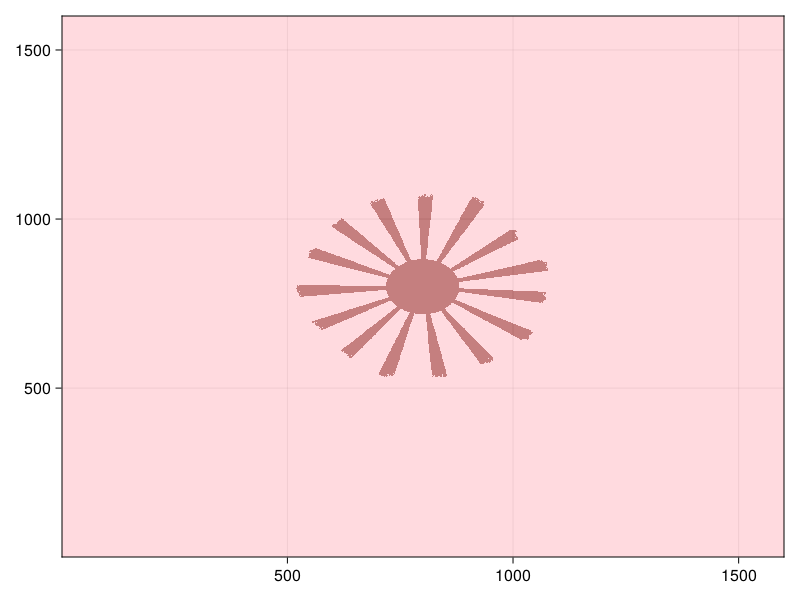

In [50]:
fig1 =heatmap(img_int_vec_5[1][:,:,6], colormap = (:reds,0.5))
#heatmap!(fig1.axis,distance_transform(feature_transform(img_int_vec_2[1][:,:,6])).== 1, colormap = (:blues, 0.5))
fig1

In [51]:
data_set = "random_finger_strong $(Dates.format(now(), "yyyy_mm_dd"))"

for (i,colony) in enumerate(img_int_vec_5)
    dir = generate_dir_vec(15, 0.2);
    for (j,t) in enumerate(time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(Center,int_img,radius_circle,Points)
            pixel_to_add = round(Int,sum(img_int_vec_5[1][:,:,1])).*(col_size_add_diff)
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], dir, still_spawn_rate= 0, dir_match_rate= 0.998  )
        end
    end   
end

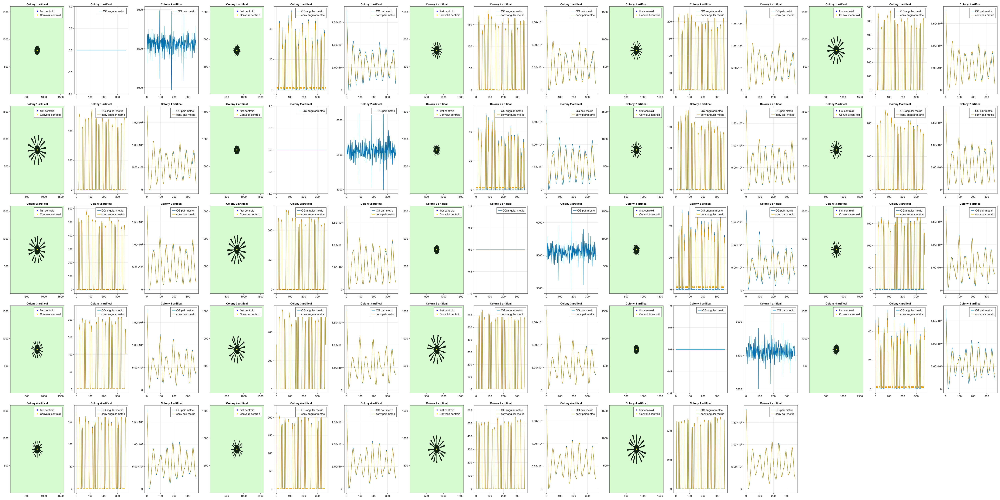

In [52]:
a = 1
fig_big = Figure(resolution = res_scaling(img_int_vec_5, factor =3, plots = 2))
c = 0 

for (i,img_stack) in enumerate(img_int_vec_5)
    int_img = img_stack[:,:,1]
    y1,x1 = centroid(int_img)
    kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
    nneigh = sum(kernel)
    
    for z in 1:size(img_stack,3)
        int_img = img_stack[:,:,z]
        out = conv( int_img, kernel ) ./ nneigh
        y_c, x_c = centroid(out .> threshold_conv)
        ang_mec_og = angular_metric(int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular)
        pair_mec_og = pair_cor_metric3(z == 1 ? int_img : int_img .- img_stack[:,:,1],[y1,x1], steps = steps_angular,samples = samples_pair)
        
        fitted_circle = build_circle([y_c, x_c], int_img, Points, threshold = threshold_c)
        ang_mec_conv = angular_metric(z == 1 ? int_img : int_img .- fitted_circle , [y1,x1], steps = steps_angular )
        
        pair_mec_conv = pair_cor_metric3(z == 1 ? int_img : int_img.- fitted_circle, [y_c, x_c], steps = steps_angular,samples = samples_pair )
        
        ax = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-2], title = colonies[i])
        heatmap!(ax,int_img,colormap = :algae)
        #heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
        scatter!(ax,y1,x1, color = :blue, markersize = 10, label = "first centroid")
        scatter!(ax,y_c, x_c, color = :yellow, markersize = 10, label = "Convolut centroid")
        axislegend(ax)
        
        ax2 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3-1], title = colonies[i])
        lines!(ax2,ang_mec_og, label = "OG angular metric" )
        
        ax3 = CairoMakie.Axis(fig_big[c÷5+1,(c%5+1)*3], title = colonies[i])
        lines!(ax3,pair_mec_og, label = "OG pair metric" )
        # convoluted angular metrix does not make sense for colony without expansion 
        if z != 1
            lines!(ax2,ang_mec_conv, label = "conv angular metric" )
            lines!(ax3,pair_mec_conv, label = "conv pair metric" )
        end
        axislegend(ax2)
        axislegend(ax3)
        push!(df,[data_set,colonies[i],time_points[z],ang_mec_og,ang_mec_conv,pair_mec_og,pair_mec_conv,sum(img_stack[:,:,1])])
        c += 1
             
    end

end


fig_big


In [53]:
path = joinpath(image_data,data_set)

"artificial data\\random_finger_strong 2023_11_08"

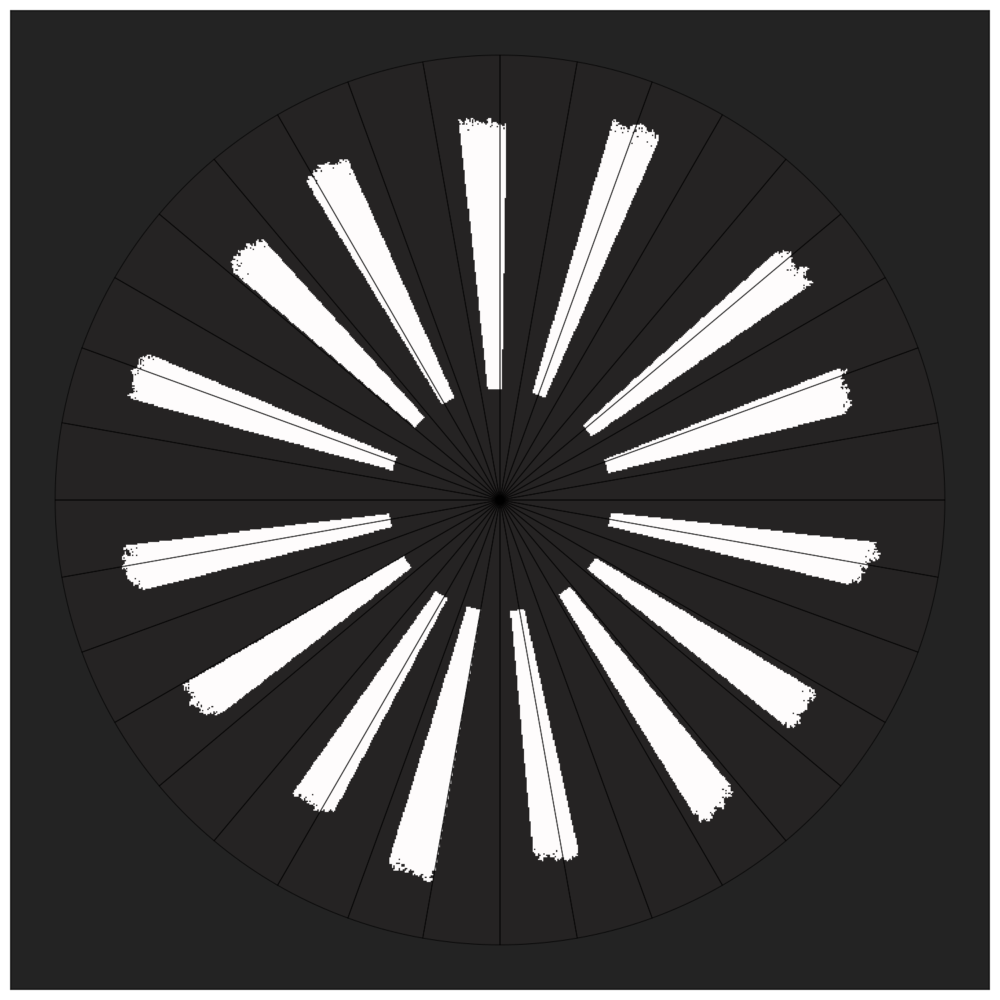

In [54]:
fig_89 = Figure(resolution =(1500,round(Int,1500)), fontsize = 28)
int_img = img_int_vec_5[1][:,:,1]
y1,x1 = centroid(int_img)
kernel = create_kernel(round(Int64,approx_radi_colo(int_img)*kernel_ratio), geometry = "square")
nneigh = sum(kernel)

int_img = img_int_vec_5[1][:,:,end]
#int_img = hcat(int_img[1:end-18,70:end],zeros(Int,1812-18,24))
#int_img = expand_matrix(int_img, annuli= 70)

cut_fac =445

int_img = int_img[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]
int_img = rotr90(int_img)



out = conv( int_img, kernel ) ./ nneigh
y_c, x_c = centroid(out .> threshold_conv)
y,x = centroid(int_img)
ax = CairoMakie.Axis(fig_89[1,1])
ax2 = CairoMakie.Axis(fig_89[1,1])
hidedecorations!(ax2)
hidedecorations!(ax)

#circle_kernel = build_circle([y_c, x_c],int_img,Points,threshold = 0.8)
#heatmap!(ax,int_img,colormap = (:hawaii,1.0))
#heatmap!(ax,out .> threshold_conv, colormap  =(:algae, 0.2))
#heatmap!(ax,circle_kernel, colormap  =(:thermal, 0.5))

int_img_1 = img_int_vec_5[1][:,:,1]
int_img_1 = int_img_1[cut_fac:end-cut_fac,cut_fac:end-cut_fac ]


int_img_1 = rotr90(int_img_1)
#heatmap!(ax,int_img,colormap = (:grayC10,1.0))

heatmap!(ax,int_img.-int_img_1,colormap = (:grayC10,1.0))
#heatmap!(ax,int_img_1, colormap  =(:thermal, 0.5))
#scatter!(ax,y1,x1, color = :blue, markersize = 15, label = "Centroid first Timestep")

#scatter!(ax,y,x, color = :red, markersize = 15, label = "Centroid")
#scatter!(ax,y_c, x_c, color = :black, markersize = 45, label = "Centroid")
pie_data = [1 for i in 1:10:360]
pie!(ax2,pie_data,radius = 10, color = (:red, 0.01))
#axislegend(ax)
fig_89

In [55]:
mkpath(path)
save(joinpath(path,"angular_pair_finger_strong_metrics.png"), fig_89)

CairoMakie.Screen{IMAGE}


In [55]:
mkpath(path)
save(joinpath(path,"angular_pair_finger_strong_metrics.png"), fig_big)

CairoMakie.Screen{IMAGE}


In [56]:
joinpath(path,"artifical_$(Dates.format(now(), "yyyy_mm_dd")).jls")

"artificial data\\random_finger_strong 2023_10_31\\artifical_2023_10_31.jls"

In [ ]:
save(joinpath(path,"angular_pair_circular_metrics.png"), fig_big)

In [ ]:
path_metric = joinpath("metrics",data_set)
mkpath(path_metric)

In [57]:
serialize(joinpath(path_metric,"artifical_$(Dates.format(now(), "yyyy_mm_dd")).jls"),df)
CSV.write(joinpath(path_metric,"artifical_$(Dates.format(now(), "yyyy_mm_dd")).csv"),df)

"artificial data\\random_finger_strong 2023_10_31\\artifical_2023_10_31.csv"

In [58]:
df

Row,data_set,colony,time,metric_OG,metric_cov,pair_OG,pair_cov,OG_size
,String,String,Int64,Array…,Array…,Array…,Array…,Int64
1,circular 2023_10_31,Colony 1 artifical,0,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0 … 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]","[63, 46, 59, 53, 58, 57, 57, 58, 56, 62 … 53, 62, 56, 58, 57, 57, 58, 53, 59, 63]","[5460, 5621, 5511, 5481, 5631, 5509, 5653, 5638, 5562, 5691 … 5591, 5560, 5525, 5518, 5501, 5663, 5511, 5620, 5557, 5513]","[5455, 5553, 5536, 5566, 5616, 5463, 5689, 5495, 5573, 5499 … 5468, 5578, 5543, 5579, 5592, 5513, 5568, 5509, 5658, 5507]",20589
2,circular 2023_10_31,Colony 1 artifical,6,"[12, 16, 8, 15, 9, 13, 10, 11, 11, 11 … 11, 11, 11, 11, 10, 13, 9, 15, 8, 12]","[0, 0, 0, 0, 0, 0, 2, 1, 2, 0 … 1, 0, 2, 1, 2, 0, 0, 0, 0, 0]","[4856, 5829, 5687, 5225, 5522, 5755, 5648, 5432, 5341, 5782 … 5679, 5507, 5402, 5587, 5841, 5390, 5179, 5733, 5862, 5297]","[0, 8034, 6308, 3240, 5926, 7654, 6226, 4253, 4967, 6792 … 6852, 5043, 4357, 6294, 7672, 5873, 3192, 6369, 7853, 6955]",20589
3,circular 2023_10_31,Colony 1 artifical,20,"[42, 56, 45, 48, 46, 46, 45, 44, 46, 46 … 45, 46, 46, 44, 45, 46, 46, 48, 45, 42]","[0, 0, 0, 0, 0, 0, 2, 2, 0, 0 … 2, 0, 0, 2, 2, 0, 0, 0, 0, 0]","[5319, 5669, 5420, 5498, 5676, 5652, 5475, 5401, 5587, 5637 … 5487, 5475, 5514, 5661, 5638, 5655, 5783, 5568, 5621, 5589]","[340, 6069, 6588, 5547, 5096, 6140, 6904, 5541, 5749, 7199 … 7225, 5894, 5552, 6807, 6121, 5091, 5645, 6548, 6039, 6888]",20589
4,circular 2023_10_31,Colony 1 artifical,24,"[54, 70, 57, 60, 58, 58, 59, 59, 58, 58 … 59, 58, 58, 59, 59, 58, 58, 60, 57, 54]","[0, 0, 2, 2, 2, 2, 2, 2, 2, 2 … 2, 2, 2, 2, 2, 2, 2, 2, 2, 0]","[5482, 5532, 5547, 5635, 5532, 5596, 5533, 5684, 5473, 5527 … 5632, 5498, 5566, 5568, 5626, 5565, 5643, 5591, 5534, 5457]","[4056, 4530, 5601, 5165, 6218, 5084, 5245, 6171, 5033, 6013 … 6019, 5127, 6261, 5141, 5126, 6252, 5235, 5882, 4453, 6934]",20589
5,circular 2023_10_31,Colony 1 artifical,44,"[152, 150, 152, 152, 148, 150, 152, 150, 150, 151 … 149, 151, 150, 150, 152, 150, 148, 152, 152, 152]","[0, 0, 0, 2, 3, 2, 3, 1, 2, 2 … 3, 2, 2, 1, 3, 2, 3, 2, 0, 0]","[5439, 5510, 5540, 5646, 5511, 5469, 5557, 5596, 5520, 5438 … 5610, 5694, 5460, 5565, 5609, 5548, 5545, 5512, 5414, 5678]","[3382, 5468, 5673, 6961, 5247, 5863, 5441, 5277, 5566, 6011 … 6114, 5435, 5358, 5408, 5762, 5342, 6919, 5638, 5512, 6028]",20589
6,circular 2023_10_31,Colony 1 artifical,48,"[179, 177, 173, 178, 178, 175, 177, 176, 175, 175 … 177, 175, 175, 176, 177, 175, 178, 178, 173, 179]","[0, 0, 0, 0, 0, 3, 3, 0, 3, 1 … 1, 1, 3, 0, 3, 3, 0, 0, 0, 0]","[5517, 5604, 5559, 5590, 5626, 5586, 5559, 5531, 5524, 5674 … 5474, 5607, 5526, 5641, 5561, 5515, 5504, 5456, 5634, 5501]","[4444, 4382, 6427, 5233, 6137, 6417, 5513, 6279, 5147, 5060 … 4948, 5168, 6432, 5651, 6419, 6270, 5261, 6469, 4371, 8605]",20589
7,circular 2023_10_31,Colony 1 artifical,60,"[274, 274, 273, 275, 275, 275, 273, 275, 275, 272 … 276, 272, 275, 275, 273, 275, 275, 275, 273, 274]","[4, 4, 3, 3, 4, 3, 5, 3, 3, 4 … 4, 4, 3, 3, 5, 3, 4, 3, 3, 4]","[5533, 5548, 5626, 5387, 5547, 5459, 5539, 5458, 5582, 5614 … 5525, 5492, 5372, 5519, 5586, 5393, 5455, 5607, 5545, 5431]","[4022, 5822, 6374, 4889, 5505, 5777, 4873, 6416, 5597, 5227 … 5365, 5480, 6263, 4861, 5910, 5745, 4829, 6118, 5665, 5567]",20589
8,circular 2023_10_31,Colony 1 artifical,72,"[410, 426, 413, 417, 412, 414, 415, 413, 414, 410 … 417, 410, 414, 413, 415, 414, 412, 417, 413, 410]","[0, 0, 0, 3, 4, 3, 2, 4, 2, 3 … 3, 3, 2, 4, 2, 3, 4, 3, 0, 0]","[5677, 5602, 5491, 5528, 5611, 5595, 5602, 5701, 5587, 5562 … 5496, 5597, 5588, 5563, 5541, 5478, 5534, 5510, 5434, 5504]","[4002, 5438, 6558, 5636, 5382, 5883, 5566, 5371, 5449, 5564 … 5805, 5429, 5490, 5485, 5929, 5489, 5705, 6365, 5399, 6094]",20589
9,circular 2023_10_31,Colony 1 artifical,84,"[612, 611, 607, 615, 613, 612, 614, 610, 614, 608 … 615, 608, 614, 611, 614, 612, 613, 615, 607, 612]","[5, 5, 5, 4, 5, 5, 5, 6, 4, 5 … 5, 5, 4, 5, 5, 5, 5, 4, 5, 5]","[5669, 5447, 5714, 5625

#### Convolution works similar to distance transform

In [48]:
fig2 =heatmap(img_int_vec_1[1][:,:,5], colormap = (:reds,0.5))
heatmap!(fig2.axis,conv(img_int_vec_1[1][:,:,5],laplac_kernel) .>0.1, colormap = (:blues, 0.5))
display(fig2)

LoadError: UndefVarError: `laplac_kernel` not defined

### Create empty test data for different methods below

In [97]:
test_array = [1 2 ; 3 1]
index = findall(test_array .>2)

1-element Vector{CartesianIndex{2}}:
 CartesianIndex(2, 1)

In [110]:
normalize(index[1].I.-[1,1])

2-element Vector{Float64}:
 1.0
 0.0

In [ ]:
findall(dir)

In [89]:
number_vecs = 20
dir= generate_dir_vec(20,0.3)

if 1 ∉ (dot.(dir,[[1,0] for i in length(dir)]) .>0.99)
    println(1)
end

In [53]:
img_int_vec = Vector{BitArray{3}}(undef, 0)
for i in 1:colony_nr
    hans =zeros(Bool, im_size...,stacks);
    hans = BitArray(hans)
    push!(img_int_vec, hans)
end
build_artifical_colony!(Center,(@view img_int_vec[1][:,:,1]),radius_circle,Points)
pixel_to_add = round(Int,sum(img_int_vec[1][:,:,1])).*(col_size_add_diff)

5-element Vector{Float64}:
  3954.8434342621044
 12438.37685962348
  4595.868920983507
 33104.99664375041
  9281.045607678687

### used different methods to calculate border area: 
first one is to use inbuild diff/gradient function of julia 
image needs to be cast on float and a lot of allocation have to be made 
-> not optimal, and also not entirely sure if it works in all "edge" :) cases


In [31]:
@benchmark begin 
    di2 = diff(Float64.(img_int_vec_1[1][:,:,1]), dims =2);
    di2 = hcat(di2, zeros(1600))
    di1 = diff(Float64.(img_int_vec_1[1][:,:,1]), dims =1);
    di1 = vcat(di1, zeros(1600)')
end


BenchmarkTools.Trial: 154 samples with 1 evaluation.
 Range (min … max):  27.589 ms … 43.595 ms  ┊ GC (min … max):  0.00% … 36.19%
 Time  (median):     34.649 ms              ┊ GC (median):    19.52%
 Time  (mean ± σ):   32.520 ms ±  3.407 ms  ┊ GC (mean ± σ):  14.17% ±  9.55%

  ▃                                                    ▁█▂     
  █▆▄▆▄▃▂▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁▁▁▁▁▁▁▁▄▄▅███▆▅▄ ▂
  27.6 ms         Histogram: frequency by time        35.4 ms <

 Memory estimate: 117.80 MiB, allocs estimate: 30.

In [32]:
di2 = diff(Float64.(img_int_vec_1[1][:,:,1]), dims =2);
di2 = hcat(di2, zeros(1600))
di1 = diff(Float64.(img_int_vec_1[1][:,:,1]), dims =1);
di1 = vcat(di1, zeros(1600)')
display(heatmap(di2.+di1))

GLMakie.Screen(...)

second way is to use the package ImageEdgeDetection and its inbuild function imgradient. As runtime is similar to first approach, it appears it does similar things under the hood. 

In [39]:
using ImageEdgeDetection, MosaicViews, ImageFiltering, ImageCore

orientation_convention₁ = OrientationConvention(in_radians = false, compass_direction = 'S')

@benchmark begin 
    g1, g2 = imgradients(img_int_vec[1][:,:,1], KernelFactors.sobel)
    angles1 = detect_gradient_orientation(g1, g2, orientation_convention₁) / 360
    findall(angles1 .!=0)
end



BenchmarkTools.Trial: 66 samples with 1 evaluation.
 Range (min … max):  67.796 ms … 82.287 ms  ┊ GC (min … max):  0.00% … 15.81%
 Time  (median):     77.245 ms              ┊ GC (median):    10.64%
 Time  (mean ± σ):   76.566 ms ±  3.594 ms  ┊ GC (mean ± σ):  10.20% ±  4.32%

                                    ▂    █                     
  ▅▁▆▃▃▃▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁██████▆█▅▅▃▅▁▃▁▁▁▁▃█▁▁▁▁▆ ▁
  67.8 ms         Histogram: frequency by time          82 ms <

 Memory estimate: 157.06 MiB, allocs estimate: 469.

Third way, is to use the distance and feature transform function of the package ImageMorphology which makes an inverse [Distance Transformation](https://en.wikipedia.org/wiki/Distance_transform) and to isolate the points with value 1 that are 1 gridpoint away from the colony. This approach is also the fastest by a factor of 2, but still requires a lot of allocations. Not sure if it can be optimised a lot. Current workaround is to only use it, after every x-added gridpoints. 

In [40]:
using ImageMorphology

@benchmark findall((distance_transform(feature_transform(img_int_vec[1][:,:,1])).== 1))

BenchmarkTools.Trial: 115 samples with 1 evaluation.
 Range (min … max):  40.709 ms … 49.351 ms  ┊ GC (min … max): 0.00% … 14.01%
 Time  (median):     41.550 ms              ┊ GC (median):    0.00%
 Time  (mean ± σ):   43.679 ms ±  3.370 ms  ┊ GC (mean ± σ):  5.15% ±  6.65%

   ▂▇█▅▅ ▁                                            ▂        
  ▅█████▆█▄▄▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▁▁▁▁▁▁▁▁▁▁▁▁▇▇█▄▆▇▃▆▄ ▃
  40.7 ms         Histogram: frequency by time        49.2 ms <

 Memory estimate: 59.22 MiB, allocs estimate: 19.

In [41]:
fig1 = heatmap(distance_transform(feature_transform(img_int_vec[1][:,:,1])).== 1, colormap = (:blues, 0.8))
heatmap!(fig1.axis, img_int_vec[1][:,:,1], colormap = (:reds, 0.5))
display(fig1)

GLMakie.Screen(...)

Fourth way and probably best way, is to use convolution. The image is convoluted with a laplacian [kernel](https://sbme-tutorials.github.io/2018/cv/notes/4_week4.html) which only assumes values above zero on edges that are not occupied. The initial convultion operation using FFTW is quite slow, but as convolution is additative, changes in the image do not require to convoluted the image again, only the convolution of the added point with the kernel has to be added to the conv image. As a a single added point is the identity element of convolution, it gets even simpler and only the kernel has to be added at the positon of the added point to the convoluted image.  

In [46]:
laplac_kernel = [0 1 0; 1 -4 1; 0 1 0]

3×3 Matrix{Int64}:
 0   1  0
 1  -4  1
 0   1  0

In [48]:
@benchmark begin 
    test = conv(img_int_vec_1[1][:,:,1],laplac_kernel)
    test[800:802,800:802] += laplac_kernel
    findall(test.>0.1)
end


BenchmarkTools.Trial: 11 samples with 1 evaluation.
 Range (min … max):  473.998 ms … 497.046 ms  ┊ GC (min … max): 0.00% … 0.00%
 Time  (median):     477.292 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   478.636 ms ±   6.676 ms  ┊ GC (mean ± σ):  0.38% ± 0.66%

  █       ▃                                                      
  █▇▁▁▇▁▁▁█▁▁▇▁▇▁▁▁▁▁▁▁▁▁▇▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▇ ▁
  474 ms           Histogram: frequency by time          497 ms <

 Memory estimate: 59.34 MiB, allocs estimate: 33.

In [55]:
test = conv(img_int_vec_1[1][:,:,1],laplac_kernel)
display(heatmap(test .>0.1))

GLMakie.Screen(...)

All the research above condensed into to seperate functions, 'expand_colony_radom!' simulating a random growth using the distance transformation of the package ImageMorpohlogy which is quite linear in scaling (depending on the reshuffle counter). 'expand_colony_radom_cov!' simulated the same random growth using convolution and a laplace kernel, its runtime is very nonlinear as the inital convolution always takes around 400 ms but everything that follows takes much less time, therefore for many added pixels and a low reshuffle counter the `expand_colony_radom_cov!` function is much faster. 

In [54]:
@benchmark expand_colony_radom_cov!((@view img_int_vec_1[3][:,:,1]),pixel_to_add[1])

BenchmarkTools.Trial: 11 samples with 1 evaluation.
 Range (min … max):  483.926 ms … 514.292 ms  ┊ GC (min … max): 0.00% … 2.39%
 Time  (median):     489.690 ms               ┊ GC (median):    0.00%
 Time  (mean ± σ):   492.199 ms ±   8.984 ms  ┊ GC (mean ± σ):  0.64% ± 0.90%

  ███ █  █   █   █    █   █       █                           █  
  ███▁█▁▁█▁▁▁█▁▁▁█▁▁▁▁█▁▁▁█▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█ ▁
  484 ms           Histogram: frequency by time          514 ms <

 Memory estimate: 64.43 MiB, allocs estimate: 8064.

In [50]:
@benchmark expand_colony_radom!((@view img_int_vec_1[4][:,:,1]),pixel_to_add[1])

BenchmarkTools.Trial: 4 samples with 1 evaluation.
 Range (min … max):  1.227 s …   1.403 s  ┊ GC (min … max): 4.50% … 4.32%
 Time  (median):     1.303 s              ┊ GC (median):    4.69%
 Time  (mean ± σ):   1.309 s ± 73.942 ms  ┊ GC (mean ± σ):  4.59% ± 0.24%

  █                 █           █                         █  
  █▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█ ▁
  1.23 s         Histogram: frequency by time         1.4 s <

 Memory estimate: 1.38 GiB, allocs estimate: 363.

In [52]:
typeof(img_int_vec_1[3][:,:,1])

BitMatrix (alias for BitArray{2})

In [56]:
point = [740,745] .-Center

2-element Vector{Int64}:
 -60
 -55

In [64]:
dir = [-1,0]

2-element Vector{Int64}:
 -1
  0

In [63]:
dot(dir,point)

115

In [66]:
center = size(img_int_vec_1[3][:,:,1]).÷2

(800, 800)